In [1]:
import pandas as pd

In [2]:
import re

In [3]:
import html

In [4]:
import textacy.preprocessing as tprep

In [5]:
from sklearn.model_selection import train_test_split

In [6]:
from sklearn.naive_bayes import MultinomialNB

In [7]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [8]:
from sklearn.svm import SVC

In [9]:
from sklearn.ensemble import RandomForestClassifier

In [10]:
from sklearn.metrics import classification_report

In [11]:
from sklearn.preprocessing import MultiLabelBinarizer

In [12]:
from sklearn.metrics import f1_score

In [13]:
from sklearn.pipeline import make_pipeline

In [14]:
from lime.lime_text import LimeTextExplainer

In [15]:
from lime import submodular_pick

In [16]:
import numpy as np

In [17]:
from collections import Counter

In [18]:
from wordcloud import WordCloud

In [19]:
from matplotlib import pyplot as plt

In [20]:
import nltk

In [21]:
from nltk.tokenize import TweetTokenizer

In [22]:
import seaborn as sns

In [23]:
import researchpy

In [24]:
tk = TweetTokenizer()

In [25]:
from nltk.corpus import stopwords

In [26]:
print(stopwords.words('english'))

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

In [27]:
stop_words = set(stopwords.words('english')) - {'what', "that'll", 'have', 'has', 
                                                'had', 'having', 'do', 'does', 'did', 'doing', 
                                                'but', 'if', 'or', 'because', 'as', 'until', 
                                                'while', 'for', 'with', 'about', 'against', 
                                                'between', 'into', 'through', 'during', 'before', 
                                                'after', 'from', 'again', 'when', 'where', 'why', 
                                                'how', 'all', 'both', 'each', 'few', 'more', 'most', 
                                                'other', 'some', 'such', 'no', 'not', 'only', 'own', 
                                                'same', 'too', 'very', 't', 'can', 'will', 'just', 
                                                'don', "don't", 'should', "should've", 'now', 'd', 
                                                'll', 'm', 've', 'aren', "aren't", 'couldn', 
                                                "couldn't", 'didn', "didn't", 'doesn', "doesn't", 
                                                'hadn', "hadn't", 'haven', "haven't", 'isn', "isn't", 
                                                'mightn', "mightn't", 'mustn', "mustn't", 'needn', 
                                                "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 
                                                'wasn', "wasn't", 'weren', "weren't", 'won', "won't", 
                                                'wouldn', "wouldn't"}

### Graphs: Tweets over Time

In [28]:
df = pd.read_csv('tweets_to_annotate1.csv')

In [29]:
df['date'] = pd.to_datetime(df['date']) # convert to datetime format

In [30]:
df.dtypes

id                              int64
text                           object
isRetweet                      object
isDeleted                      object
device                         object
favorites                       int64
retweets                        int64
date                   datetime64[ns]
isFlagged                      object
isMisrepresentation            object
justification                  object
dtype: object

In [31]:
df['year'] = df['date'].dt.year # creates new year column from date column

<Axes: title={'center': 'Number of Tweets'}, xlabel='year'>

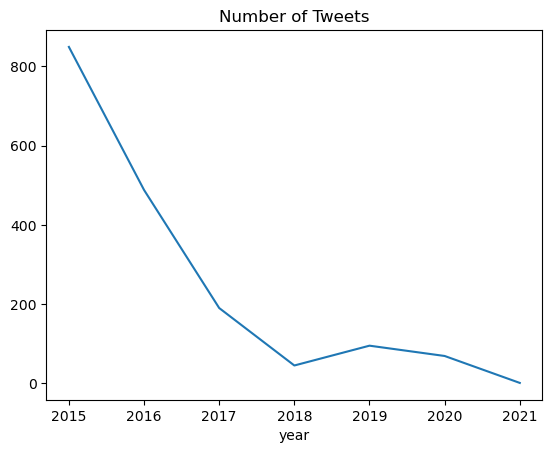

In [32]:
df.groupby('year').size().plot(title="Number of Tweets") # creates graph from all items in pre-annotation dataframe by year

In [33]:
df2 = pd.read_csv('misrepresentation_tweets_dataset.csv')

In [34]:
df2['date'] = pd.to_datetime(df2['date'])

In [35]:
df2['year'] = df2['date'].dt.year

<Axes: title={'center': 'Number of Tweets'}, xlabel='year'>

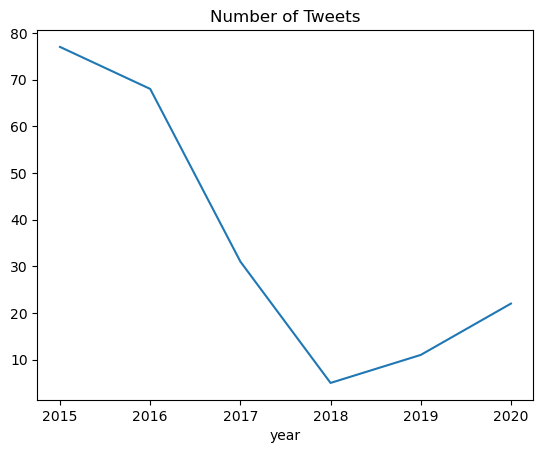

In [36]:
# creates graph from all items in misrepresentation dataframe by year
df2.groupby('year').size().plot(title="Number of Tweets")

<Axes: title={'center': 'Number of Tweets'}, xlabel='year'>

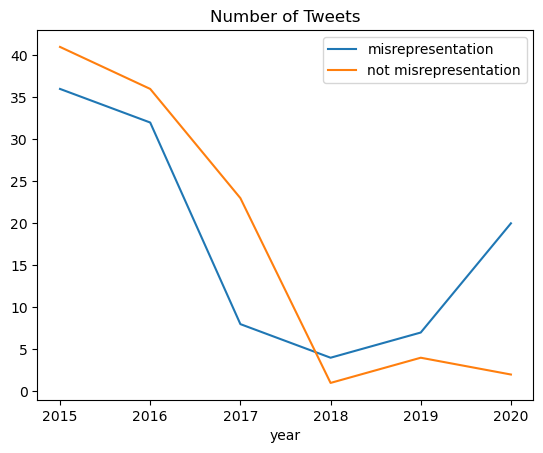

In [37]:
# creates graph with curves for each label from items in misrepresentation dataframe
df2[df2['isMisrepresentation'] == 't'].groupby('year').size().plot(title="Number of Tweets", legend = True, label = 'misrepresentation')
df2[df2['isMisrepresentation'] == 'f'].groupby('year').size().plot(title="Number of Tweets", legend = True, label = 'not misrepresentation')

### Data Preparation

In [38]:
df = pd.read_csv(r'C:\Users\bruna\projects\MA thesis\misrepresentation_tweets_dataset.csv')

In [39]:
# select relevant columns for data preparation
df = df[['text','isMisrepresentation']]

In [40]:
# remove rows containing empty values
df = df.dropna()

In [41]:
df

,text,isMisrepresentation
0,"""Hillary said with respect to ISIS, """"we are f...",t
1,""""""" Haim Saban: Hillary Clinton’s Top Hollywoo...",t
2,"""Hillary just said that she will not use the t...",t
3,"""""""@Co: CBS reports """"swarms"""" of celebrators ...",t
4,"""""""@WayneDupreeShow: """"It’s clear that Donald ...",t
...,...,...
209,"""Keep up the GREAT work. I am with you 100%!""""...",f
210,"""""""@D: #MaryBrigidMcManamon, Washington Post: ...",f
211,"""""""It is the assessment of the U.S. government...",f
212,"""""""@HMaewest: Via the Washington Post: Inside...",f


In [42]:
# function to remove noise
def clean(text):
    text = html.unescape(text) # convert html escapes to characters
    text = re.sub(r'<[^<>]*>', ' ', text) # replace tags with whitespace
    text = re.sub(r'(?:^|\s)[&#<>{}\[\]+|\\:-]{1,}(?:\s|$)', ' ', text) # replace standalone sequences of specials
    text = re.sub(r'(?:^|\s)[\-=\+]{2,}(?:\s|$)', ' ', text) # replace standalone sequences of hyphens with whitespace
    text = re.sub(r'\s+', ' ', text) # replace sequences of white spaces with whitespace
    text = re.sub(r'"', '', text) # remove quotation marks
    text = re.sub(r'(https?://\S+)|:', '', text) # remove colons except in URL
    return text.strip()

In [43]:
# function for normalization and masking
def normalize(text):
    text = tprep.normalize.unicode(text) # unify different codes of accented characters in Unicode
    text = tprep.remove.accents(text) # replace accented characters with ASCII or drop them
    text = tprep.replace.urls(text) # replace URLs with default substitution
    text = tprep.replace.emails(text) # replace emails with default substitution
    return text

In [44]:
df['original_text'] = df['text']

In [45]:
df['text'] = df['text'].apply(clean) # apply function to remove noise on text column of df

In [46]:
df['text'] = df['text'].apply(normalize) # apply function to normalize on text column of df

In [47]:
df.sample(2)

,text,isMisrepresentation,original_text
162,@ScottWRasmussen Donald Trump and Bikers Share...,f,"""""""@ScottWRasmussen: Donald Trump and Bikers S..."
76,Joe wants to shut down this Country. I want to...,t,Joe wants to shut down this Country. I want to...


In [48]:
df['text'] = df['text'].str.lower() # convert text to lowercase

In [49]:
df['text'] = df['text'].apply(tk.tokenize) # tokenize text

In [50]:
df['text'] = df['text'].apply(lambda x: [word for word in x if word not in stop_words]) # remove stopwords

In [51]:
df['text']

0      [hillary, said, with, respect, isis, ,, finall...
1      [haim, saban, hillary, clinton, ’, top, hollyw...
2      [hillary, just, said, will, not, use, term, ra...
3      [@co, cbs, reports, swarms, celebrators, roofs...
4      [@waynedupreeshow, ’, clear, donald, trump, no...
                             ...                        
209    [keep, great, work, ., with, 100, %, !, isis, ...
210    [@d, #marybrigidmcmanamon, ,, washington, post...
211    [assessment, u, ., ., government, iran, respon...
212    [@hmaewest, via, washington, post, inside, wor...
213    [wow, ,, cnn, had, retract, big, story, russia...
Name: text, Length: 214, dtype: object

### Train-Test Split

In [52]:
X_train, X_test, Y_train, Y_test = train_test_split(df['text'], df['isMisrepresentation'], 
                                                    test_size=0.2, stratify=df['isMisrepresentation'])

In [53]:
print('Size of Training Data ', X_train.shape[0])

Size of Training Data  171


In [54]:
print('Size of Test Data ', X_test.shape[0])

Size of Test Data  43


### Naïve Bayes Classifier

In [55]:
# adapted from https://www.davidsbatista.net/blog/2018/02/28/TfidfVectorizer/

# define a dummy function to let TfidfVectorizer use a pretokenized text
# instead of calling a specific tokenizer and preprocessor the function just feeds it the tokenized text, hence "return doc"

def dummy_fun(doc):
    return doc


In [56]:
tfidf = TfidfVectorizer(tokenizer = dummy_fun, preprocessor = dummy_fun, token_pattern = None)


In [57]:
X_train_tf = tfidf.fit_transform(X_train)

X_train_tf

<171x1404 sparse matrix of type '<class 'numpy.float64'>'
	with 2970 stored elements in Compressed Sparse Row format>

In [58]:
nb_clf = MultinomialNB()

In [59]:
nb_clf.fit(X_train_tf, Y_train) # train classifier

MultinomialNB()

In [60]:
X_test_tf = tfidf.transform(X_test)

In [61]:
Y_pred_nb = nb_clf.predict(X_test_tf)

In [62]:
accuracy = nb_clf.score(X_test_tf, Y_test) # calculate accuracy NB classifier

In [63]:
print('Accuracy NB:', accuracy) # print accuracy NB classifier

Accuracy NB: 0.813953488372093


In [64]:
print(classification_report(Y_test, Y_pred_nb))

              precision    recall  f1-score   support

           f       0.88      0.71      0.79        21
           t       0.77      0.91      0.83        22

    accuracy                           0.81        43
   macro avg       0.83      0.81      0.81        43
weighted avg       0.82      0.81      0.81        43



In [65]:
def nb_runs():
    X_train, X_test, Y_train, Y_test = train_test_split(df['text'], df['isMisrepresentation'], 
                                                        test_size=0.2, stratify=df['isMisrepresentation'])
    tfidf = TfidfVectorizer(tokenizer = dummy_fun, preprocessor = dummy_fun, token_pattern = None)
    
    X_train_tf = tfidf.fit_transform(X_train)
    
    X_test_tf = tfidf.transform(X_test)
    
    
    nb_clf = MultinomialNB()
    
    nb_clf.fit(X_train_tf, Y_train) # train classifier
    
    Y_pred_nb = nb_clf.predict(X_test_tf)
    
    # accuracy
    accuracy = nb_clf.score(X_test_tf, Y_test) # calculate accuracy NB classifier
    
    # f1 weighted
    binarizer = MultiLabelBinarizer()
    binarizer.fit(Y_test)
    f1_score_w = f1_score(binarizer.transform(Y_test),
                          binarizer.transform(Y_pred_nb), 
                          average='weighted')
    
    return accuracy, f1_score_w

In [66]:
n_runs = 200

nb_scores = [nb_runs() for i in range(n_runs)]

nb_accuracy_avg = sum([i[0] for i in nb_scores]) / float(len([i[0] for i in nb_scores]))

nb_f1_w_avg = sum([i[1] for i in nb_scores]) / float(len([i[1] for i in nb_scores]))

print('Number of runs: ' + str(n_runs))
print('Accuracy: ' + str(nb_accuracy_avg))
print('f1 score weighted: ' + str(nb_accuracy_avg))

Number of runs: 200
Accuracy: 0.7230232558139543
f1 score weighted: 0.7230232558139543


### Linear SVC Classifier

In [67]:
lin_clf = SVC(kernel='linear', probability=True)

In [68]:
lin_clf.fit(X_train_tf, Y_train)

SVC(kernel='linear', probability=True)

In [69]:
Y_pred_lin = lin_clf.predict(X_test_tf)

In [70]:
accuracy = lin_clf.score(X_test_tf, Y_test)

In [71]:
print('Accuracy Linear SVC:', accuracy)

Accuracy Linear SVC: 0.813953488372093


In [72]:
print(classification_report(Y_test, Y_pred_lin))

              precision    recall  f1-score   support

           f       0.93      0.67      0.78        21
           t       0.75      0.95      0.84        22

    accuracy                           0.81        43
   macro avg       0.84      0.81      0.81        43
weighted avg       0.84      0.81      0.81        43



In [73]:
def svc_runs():
    X_train, X_test, Y_train, Y_test = train_test_split(df['text'], df['isMisrepresentation'], 
                                                        test_size=0.2, stratify=df['isMisrepresentation'])
    tfidf = TfidfVectorizer(tokenizer = dummy_fun, preprocessor = dummy_fun, token_pattern = None)
    
    X_train_tf = tfidf.fit_transform(X_train)
    
    X_test_tf = tfidf.transform(X_test)
    
    
    lin_clf = SVC(kernel='linear', probability=True)
    
    lin_clf.fit(X_train_tf, Y_train)
    
    Y_pred_lin = lin_clf.predict(X_test_tf)
    
    # accuracy    
    accuracy = lin_clf.score(X_test_tf, Y_test)
    
    # f1 weighted
    binarizer = MultiLabelBinarizer()
    binarizer.fit(Y_test)
    f1_score_w = f1_score(binarizer.transform(Y_test),
                          binarizer.transform(Y_pred_lin), 
                          average='micro')
    
    return accuracy, f1_score_w

In [74]:
n_runs = 200

svc_scores = [svc_runs() for i in range(n_runs)]

svc_accuracy_avg = sum([i[0] for i in svc_scores]) / float(len([i[0] for i in svc_scores]))

svc_f1_w_avg = sum([i[1] for i in svc_scores]) / float(len([i[1] for i in svc_scores]))

print('Number of runs: ' + str(n_runs))
print('Accuracy: ' + str(svc_accuracy_avg))
print('f1 score weighted: ' + str(svc_f1_w_avg))

Number of runs: 200
Accuracy: 0.7230232558139537
f1 score weighted: 0.7230232558139537


### Random Forest Classifier

In [75]:
rf_clf = RandomForestClassifier()

In [76]:
rf_clf.fit(X_train_tf, Y_train)

RandomForestClassifier()

In [77]:
Y_pred_rf = rf_clf.predict(X_test_tf)

In [78]:
accuracy = rf_clf.score(X_test_tf, Y_test)

In [79]:
print('Accuracy Linear RF:', accuracy)

Accuracy Linear RF: 0.6744186046511628


In [80]:
print(classification_report(Y_test, Y_pred_rf))

              precision    recall  f1-score   support

           f       0.65      0.71      0.68        21
           t       0.70      0.64      0.67        22

    accuracy                           0.67        43
   macro avg       0.68      0.68      0.67        43
weighted avg       0.68      0.67      0.67        43



In [81]:
def rf_runs():
    X_train, X_test, Y_train, Y_test = train_test_split(df['text'], df['isMisrepresentation'], 
                                                        test_size=0.2, stratify=df['isMisrepresentation'])
    tfidf = TfidfVectorizer(tokenizer = dummy_fun, preprocessor = dummy_fun, token_pattern = None)
    
    X_train_tf = tfidf.fit_transform(X_train)
    
    X_test_tf = tfidf.transform(X_test)
    
    
    rf_clf = RandomForestClassifier()
    
    rf_clf.fit(X_train_tf, Y_train)
    
    Y_pred_rf = rf_clf.predict(X_test_tf)
    
    # accuracy 
    accuracy = rf_clf.score(X_test_tf, Y_test)
    
    # f1 weighted
    binarizer = MultiLabelBinarizer()
    binarizer.fit(Y_test)
    f1_score_w = f1_score(binarizer.transform(Y_test),
                          binarizer.transform(Y_pred_rf), 
                          average='micro')
    
    return accuracy, f1_score_w

In [82]:
n_runs = 200

rf_scores = [rf_runs() for i in range(n_runs)]

rf_accuracy_avg = sum([i[0] for i in rf_scores]) / float(len([i[0] for i in rf_scores]))

rf_f1_w_avg = sum([i[1] for i in rf_scores]) / float(len([i[1] for i in rf_scores]))

print('Number of runs: ' + str(n_runs))
print('Accuracy: ' + str(rf_accuracy_avg))
print('f1 score weighted: ' + str(rf_f1_w_avg))

Number of runs: 200
Accuracy: 0.6893023255813959
f1 score weighted: 0.6893023255813959


### Summary Statistics

In [83]:
# list of tuples with results from multiple runs was stored in earlier step 
# here, accuracy for each run is extracted from each tuple

nb_ac = []
for i in nb_scores:
    nb_ac.append(i[1])
    
svc_ac = []
for i in svc_scores:
    svc_ac.append(i[1])

rf_ac = []
for i in rf_scores:
    rf_ac.append(i[1])

nb_results = pd.DataFrame(nb_ac, columns = ['Accuracy'])
nb_results['Classifier'] = 'Naïve Bayes classifier'

svc_results = pd.DataFrame(svc_ac, columns = ['Accuracy'])
svc_results['Classifier'] = 'Support Vector classifier'
    
rf_results = pd.DataFrame(rf_ac, columns = ['Accuracy'])
rf_results['Classifier'] = 'Random Forest classifier'

results_df = pd.concat([nb_results, svc_results, rf_results])

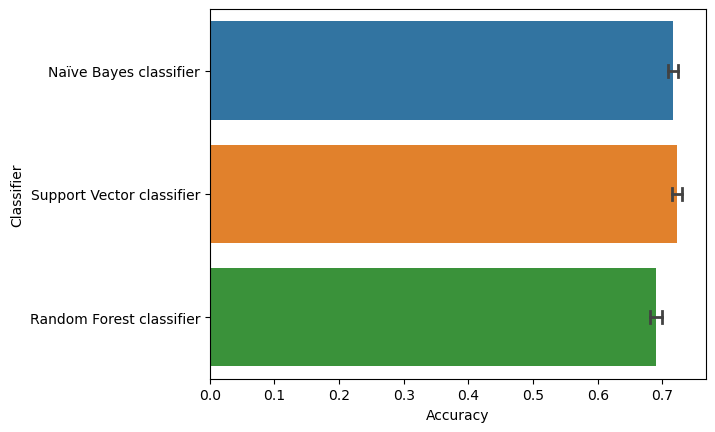

In [84]:
sns.barplot(x = "Accuracy", y = "Classifier", 
            errorbar = ('ci', 95), errwidth = 2, capsize = 0.1, 
            data = results_df)
plt.show()

In [85]:
# Summary statistics
researchpy.summary_cont(results_df['Accuracy'].groupby(results_df['Classifier']))

,N,Mean,SD,SE,95% Conf.,Interval
Classifier,,,,,,
Naïve Bayes classifier,200,0.7163,0.0587,0.0042,0.7081,0.7244
Random Forest classifier,200,0.6893,0.0647,0.0046,0.6803,0.6983
Support Vector classifier,200,0.7230,0.0585,0.0041,0.7149,0.7312


### LIME Text Explainer

In [86]:
class_names = ["f", "t"] 

In [87]:
# creates dataframe with all predictions
result_nb = pd.DataFrame({'original_text': df['original_text'].loc[X_test.index],
                          'text': X_test.values, 
                          'actual': Y_test.values, 
                          'predicted': Y_pred_nb })

In [88]:
prob_nb = nb_clf.predict_proba(X_test_tf) # calculates prediction probabilities

In [89]:
# creates new dataframe for explainable results
er_nb = result_nb.copy().reset_index()
for i, c in enumerate(class_names):
    er_nb[c] = prob_nb[:, i]

In [90]:
pipeline_nb = make_pipeline(tfidf, nb_clf) # vectorizer and classifier arranged in pipeline

In [91]:
# displays complete original text
with pd.option_context('display.max_colwidth', None):
  display(er_nb[er_nb["predicted"] != er_nb["actual"]])

,index,original_text,text,actual,predicted,f,t
4,186,Kasich just announced that he wants the people of Indiana to vote for him. Typical politician - can't make a deal work.,"[kasich, just, announced, wants, people, indiana, vote, for, ., typical, politician, can't, make, deal, work, .]",f,t,0.329572,0.670428
5,198,"As a candidate, I promised we would pass a massive tax cut for the everyday, working Americans. If you make your voices heard, this moment will be forever remembered as a great new beginning – the dawn of a brilliant American future shining with PATRIOTISM, PROSPERITY AND PRIDE! https://t.co/exsBzrlCdw","[as, candidate, ,, promised, would, pass, massive, tax, cut, for, everyday, ,, working, americans, ., if, make, voices, heard, ,, moment, will, forever, remembered, as, great, new, beginning, –, dawn, brilliant, american, future, shining, with, patriotism, ,, prosperity, pride, !]",f,t,0.497805,0.502195
6,154,"""Does anybody really believe that a reporter, who nobody ever heard of, """"went to his mailbox"""" and found my tax returns? @NBCNews FAKE NEWS!""","[does, anybody, really, believe, reporter, ,, nobody, ever, heard, ,, went, mailbox, found, tax, returns, ?, @nbcnews, fake, news, !]",f,t,0.451894,0.548106
8,4,"""""""@WayneDupreeShow: """"It’s clear that Donald Trump was NOT even talking about a Muslim Database!"""" https://t.co/3tLDZj2WGV""""""","[@waynedupreeshow, ’, clear, donald, trump, not, even, talking, about, muslim, database, !]",t,f,0.664832,0.335168
19,185,".@megynkelly recently said that she can’t be wooed by Trump. She is so average in every way, who the hell wants to woo her!","[., @megynkelly, recently, said, can, ’, t, wooed, trump, ., average, every, way, ,, hell, wants, woo, !]",f,t,0.406748,0.593252
34,195,"Crooked Hillary promised 200k jobs in NY and FAILED. We'll create 25M jobs when I'm president, and I will DELIVER! https://t.co/NgyCkEH7Xn","[crooked, hillary, promised, 200k, jobs, ny, failed, ., we'll, create, 25m, jobs, when, i'm, president, ,, will, deliver, !]",f,t,0.431612,0.568388
36,69,"Governor Andrew Cuomo of New York wants to put New York at the END of the Vaccine List in that he doesn’t trust the @FDA or Federal Government, even though the Vaccines are being developed by the finest Labs in the World. Wish he trusted us on Nursing Homes!","[governor, andrew, cuomo, new, york, wants, put, new, york, end, vaccine, list, doesn, ’, t, trust, @fda, or, federal, government, ,, even, though, vaccines, developed, finest, labs, world, ., wish, trusted, us, nursing, homes, !]",t,f,0.510508,0.489492
38,107,""".@RudyGiuliani, one of the finest people I know and a former GREAT Mayor of N.Y.C., just took himself out of consideration for """"State"""".""","[., @rudygiuliani, ,, one, finest, people, know, former, great, mayor, n, ., ., c, ., ,, just, took, consideration, for, state, .]",f,t,0.459650,0.540350


In [92]:
len(er_nb)

43

In [93]:
len(er_nb[er_nb["predicted"] != er_nb["actual"]])

8

In [94]:
explainer = LimeTextExplainer(class_names=class_names) # creates explainer

In [95]:
# applies explainer
exp_nb = explainer.explain_instance(' '.join(er_nb.iloc[15]["text"]),
                                 pipeline_nb.predict_proba,
                                 num_features = 15,
                                 top_labels = 1)

In [96]:
exp_nb.show_in_notebook()

In [97]:
# finds representative samples
lsm_nb = submodular_pick.SubmodularPick(explainer, er_nb['text'].agg(' '.join).values, 
                                        pipeline_nb.predict_proba, 
                                        sample_size = 43, 
                                        num_features = 20,
                                        num_exps_desired=2)

In [98]:
lsm_nb.explanations[0].show_in_notebook()

In [99]:
er_nb

,index,original_text,text,actual,predicted,f,t
0,19,"""Just announced that because of """"Trump"""", adv...","[just, announced, because, trump, ,, advertisi...",t,t,0.426256,0.573744
1,144,"""""""State Department official accused of offeri...","[state, department, official, accused, offerin...",f,f,0.527711,0.472289
2,94,"Unlike crooked Hillary Clinton, who wants to d...","[unlike, crooked, hillary, clinton, ,, wants, ...",t,t,0.179037,0.820963
3,71,"Voting starts in Virginia TODAY, and we are go...","[voting, starts, virginia, today, ,, going, wi...",t,t,0.287668,0.712332
4,186,Kasich just announced that he wants the people...,"[kasich, just, announced, wants, people, india...",f,t,0.329572,0.670428
5,198,"As a candidate, I promised we would pass a mas...","[as, candidate, ,, promised, would, pass, mass...",f,t,0.497805,0.502195
6,154,"""Does anybody really believe that a reporter, ...","[does, anybody, really, believe, reporter, ,, ...",f,t,0.451894,0.548106
7,156,"""Bush and Rubio are finally attacking each oth...","[bush, rubio, finally, attacking, each, other,...",f,f,0.529783,0.470217
8,4,"""""""@WayneDupreeShow: """"It’s clear that Donald ...","[@waynedupreeshow, ’, clear, donald, trump, no...",t,f,0.664832,0.335168
9,164,"""Wow, @FoxNews just reporting big news. Source...","[wow, ,, @foxnews, just, reporting, big, news,...",f,f,0.524375,0.475625


In [100]:
result_lin = pd.DataFrame({'original_text': df['original_text'].loc[X_test.index],
                           'text': X_test.values,
                           'actual': Y_test.values,
                           'predicted': Y_pred_lin })

In [101]:
prob_lin = lin_clf.predict_proba(X_test_tf)

In [102]:
# new dataframe for explainable results
er_lin = result_lin.copy().reset_index()
for i, c in enumerate(class_names):
    er_lin[c] = prob_lin[:, i]

In [103]:
pipeline_lin = make_pipeline(tfidf, lin_clf)

In [104]:
with pd.option_context('display.max_colwidth', None):
  display(er_lin[er_lin["predicted"] != er_lin["actual"]])

,index,original_text,text,actual,predicted,f,t
4,186,Kasich just announced that he wants the people of Indiana to vote for him. Typical politician - can't make a deal work.,"[kasich, just, announced, wants, people, indiana, vote, for, ., typical, politician, can't, make, deal, work, .]",f,t,0.126194,0.873806
6,154,"""Does anybody really believe that a reporter, who nobody ever heard of, """"went to his mailbox"""" and found my tax returns? @NBCNews FAKE NEWS!""","[does, anybody, really, believe, reporter, ,, nobody, ever, heard, ,, went, mailbox, found, tax, returns, ?, @nbcnews, fake, news, !]",f,t,0.474907,0.525093
8,4,"""""""@WayneDupreeShow: """"It’s clear that Donald Trump was NOT even talking about a Muslim Database!"""" https://t.co/3tLDZj2WGV""""""","[@waynedupreeshow, ’, clear, donald, trump, not, even, talking, about, muslim, database, !]",t,f,0.864267,0.135733
12,209,"""Keep up the GREAT work. I am with you 100%!""""ISIS is losing its grip...""""Army Colonel Ryan DillonCJTF–OIRhttps://t.co/jVGuvv5mzm https://t.co/PSCXg38CtS""","[keep, great, work, ., with, 100, %, !, isis, losing, grip, ..., army, colonel, ryan, dilloncjtf, –, oir]",f,t,0.509442,0.490558
19,185,".@megynkelly recently said that she can’t be wooed by Trump. She is so average in every way, who the hell wants to woo her!","[., @megynkelly, recently, said, can, ’, t, wooed, trump, ., average, every, way, ,, hell, wants, woo, !]",f,t,0.296382,0.703618
25,147,"""Great poll numbers just coming out of New Hampshire. BIG lead for """"Trump"""" according to @CNN!""","[great, poll, numbers, just, coming, new, hampshire, ., big, lead, for, trump, according, @cnn, !]",f,t,0.444164,0.555836
34,195,"Crooked Hillary promised 200k jobs in NY and FAILED. We'll create 25M jobs when I'm president, and I will DELIVER! https://t.co/NgyCkEH7Xn","[crooked, hillary, promised, 200k, jobs, ny, failed, ., we'll, create, 25m, jobs, when, i'm, president, ,, will, deliver, !]",f,t,0.412516,0.587484
38,107,""".@RudyGiuliani, one of the finest people I know and a former GREAT Mayor of N.Y.C., just took himself out of consideration for """"State"""".""","[., @rudygiuliani, ,, one, finest, people, know, former, great, mayor, n, ., ., c, ., ,, just, took, consideration, for, state, .]",f,t,0.304810,0.695190


In [105]:
len(er_lin)

43

In [106]:
len(er_lin[er_lin["predicted"] != er_lin["actual"]])

8

In [107]:
exp_lin = explainer.explain_instance(' '.join(er_lin.iloc[1]["text"]),
                                     pipeline_lin.predict_proba,
                                     num_features = 15,
                                     top_labels = 1)

In [108]:
exp_lin.show_in_notebook()

In [109]:
lsm_lin = submodular_pick.SubmodularPick(explainer, er_lin['text'].agg(' '.join).values, 
                                         pipeline_lin.predict_proba, 
                                         sample_size = 43, 
                                         num_features = 20,
                                         num_exps_desired=2)

In [110]:
lsm_lin.explanations[0].show_in_notebook()

In [111]:
er_lin

,index,original_text,text,actual,predicted,f,t
0,19,"""Just announced that because of """"Trump"""", adv...","[just, announced, because, trump, ,, advertisi...",t,t,0.340082,0.659918
1,144,"""""""State Department official accused of offeri...","[state, department, official, accused, offerin...",f,f,0.621363,0.378637
2,94,"Unlike crooked Hillary Clinton, who wants to d...","[unlike, crooked, hillary, clinton, ,, wants, ...",t,t,0.023462,0.976538
3,71,"Voting starts in Virginia TODAY, and we are go...","[voting, starts, virginia, today, ,, going, wi...",t,t,0.191546,0.808454
4,186,Kasich just announced that he wants the people...,"[kasich, just, announced, wants, people, india...",f,t,0.126194,0.873806
5,198,"As a candidate, I promised we would pass a mas...","[as, candidate, ,, promised, would, pass, mass...",f,f,0.548914,0.451086
6,154,"""Does anybody really believe that a reporter, ...","[does, anybody, really, believe, reporter, ,, ...",f,t,0.474907,0.525093
7,156,"""Bush and Rubio are finally attacking each oth...","[bush, rubio, finally, attacking, each, other,...",f,f,0.662169,0.337831
8,4,"""""""@WayneDupreeShow: """"It’s clear that Donald ...","[@waynedupreeshow, ’, clear, donald, trump, no...",t,f,0.864267,0.135733
9,164,"""Wow, @FoxNews just reporting big news. Source...","[wow, ,, @foxnews, just, reporting, big, news,...",f,f,0.517082,0.482918


In [112]:
result_rf = pd.DataFrame({'original_text': df['original_text'].loc[X_test.index],
                          'text': X_test.values,
                          'actual': Y_test.values,
                          'predicted': Y_pred_rf })

In [113]:
prob_rf = rf_clf.predict_proba(X_test_tf)

In [114]:
# new dataframe for explainable results
er_rf = result_rf.copy().reset_index()
for i, c in enumerate(class_names):
    er_rf[c] = prob_rf[:, i]

In [115]:
pipeline_rf = make_pipeline(tfidf, rf_clf)

In [116]:
with pd.option_context('display.max_colwidth', None):
  display(er_rf[er_rf["predicted"] != er_rf["actual"]])

,index,original_text,text,actual,predicted,f,t
0,19,"""Just announced that because of """"Trump"""", advertising rates for debate on @CNN are going from $5000 to $200,000, a 4000% increase.PAY CHARITY?""","[just, announced, because, trump, ,, advertising, rates, for, debate, @cnn, going, from, $, 5000, $, 200,000, ,, 4000, %, increase.pay, charity, ?]",t,f,0.56,0.44
4,186,Kasich just announced that he wants the people of Indiana to vote for him. Typical politician - can't make a deal work.,"[kasich, just, announced, wants, people, indiana, vote, for, ., typical, politician, can't, make, deal, work, .]",f,t,0.46,0.54
8,4,"""""""@WayneDupreeShow: """"It’s clear that Donald Trump was NOT even talking about a Muslim Database!"""" https://t.co/3tLDZj2WGV""""""","[@waynedupreeshow, ’, clear, donald, trump, not, even, talking, about, muslim, database, !]",t,f,0.75,0.25
9,164,"""Wow, @FoxNews just reporting big news. Source: """"Official behind unmasking is high up. Known Intel official is responsible. Some unmasked....""","[wow, ,, @foxnews, just, reporting, big, news, ., source, official, behind, unmasking, high, ., known, intel, official, responsible, ., some, unmasked, ...]",f,t,0.46,0.54
10,84,.@KarlRove stated clearly that he wants to repeal the 2nd Amendment. I thought @FoxNews was going to fire that jerk after his Romney fiasco?,"[., @karlrove, stated, clearly, wants, repeal, 2nd, amendment, ., thought, @foxnews, going, fire, jerk, after, romney, fiasco, ?]",t,f,0.55,0.45
12,209,"""Keep up the GREAT work. I am with you 100%!""""ISIS is losing its grip...""""Army Colonel Ryan DillonCJTF–OIRhttps://t.co/jVGuvv5mzm https://t.co/PSCXg38CtS""","[keep, great, work, ., with, 100, %, !, isis, losing, grip, ..., army, colonel, ryan, dilloncjtf, –, oir]",f,t,0.41,0.59
13,66,".@60Minutes &amp; third place anchor, @NorahODonnell, are doing everything in their power to demean our Country, much to the benefit of the Radical Left Democrats. Tonight they put on yet another Fake “Whistleblower”, a disgruntled employee who supports Dems, fabricates stories, &amp;...","[., @60minutes, third, place, anchor, ,, @norahodonnell, ,, doing, everything, power, demean, country, ,, much, benefit, radical, left, democrats, ., tonight, put, yet, another, fake, “, whistleblower, ”, ,, disgruntled, employee, supports, dems, ,, fabricates, stories, ,, &, ...]",t,f,0.56,0.44
15,42,"""""""@Jimbos2002: @Morning_Joe Video: Hillary referring to blacks as super predators that need to be brought to heel. https://t.co/pMIHWayMRw""""""","[@jimbos2002, @morning_joe, video, hillary, referring, blacks, as, super, predators, need, brought, heel, .]",t,f,0.52,0.48
19,185,".@megynkelly recently said that she can’t be wooed by Trump. She is so average in every way, who the hell wants to woo her!","[., @megynkelly, recently, said, can, ’, t, wooed, trump, ., average, every, way, ,, hell, wants, woo, !]",f,t,0.41,0.59
29,25,"""""""@fedupwithgovern: Congress Can't Find Money for Veterans *Houses, Feeds, Educates, Provide Drs for illegals *Gives Iran over $200 Billion""""""","[@fedupwithgovern, congress, can't, find, money, for, veterans, *, houses, ,, feeds, ,, educates, ,, provide, drs, for, illegals, *, gives, iran, $, 200, billion]",t,f,0.74,0.26


In [117]:
len(er_rf)

43

In [118]:
len(er_rf[er_rf["predicted"] != er_rf["actual"]])

14

In [119]:
exp_rf = explainer.explain_instance(' '.join(er_rf.iloc[1]["text"]),
                                    pipeline_lin.predict_proba,
                                    num_features = 15,
                                    top_labels = 1)

In [120]:
exp_rf.show_in_notebook()

In [121]:
lsm_rf = submodular_pick.SubmodularPick(explainer, er_rf['text'].agg(' '.join).values, 
                                        pipeline_rf.predict_proba, 
                                        sample_size = 43, 
                                        num_features = 20,
                                        num_exps_desired=2)

In [122]:
lsm_rf.explanations[0].show_in_notebook()

In [123]:
er_rf

,index,original_text,text,actual,predicted,f,t
0,19,"""Just announced that because of """"Trump"""", adv...","[just, announced, because, trump, ,, advertisi...",t,f,0.56,0.44
1,144,"""""""State Department official accused of offeri...","[state, department, official, accused, offerin...",f,f,0.72,0.28
2,94,"Unlike crooked Hillary Clinton, who wants to d...","[unlike, crooked, hillary, clinton, ,, wants, ...",t,t,0.06,0.94
3,71,"Voting starts in Virginia TODAY, and we are go...","[voting, starts, virginia, today, ,, going, wi...",t,t,0.33,0.67
4,186,Kasich just announced that he wants the people...,"[kasich, just, announced, wants, people, india...",f,t,0.46,0.54
5,198,"As a candidate, I promised we would pass a mas...","[as, candidate, ,, promised, would, pass, mass...",f,f,0.59,0.41
6,154,"""Does anybody really believe that a reporter, ...","[does, anybody, really, believe, reporter, ,, ...",f,f,0.53,0.47
7,156,"""Bush and Rubio are finally attacking each oth...","[bush, rubio, finally, attacking, each, other,...",f,f,0.63,0.37
8,4,"""""""@WayneDupreeShow: """"It’s clear that Donald ...","[@waynedupreeshow, ’, clear, donald, trump, no...",t,f,0.75,0.25
9,164,"""Wow, @FoxNews just reporting big news. Source...","[wow, ,, @foxnews, just, reporting, big, news,...",f,t,0.46,0.54


In [124]:
counter_nb = Counter() # creates counter

In [125]:
er_nb['text'].map(counter_nb.update); # ";" hides output of this cell so as not to return "none"

In [126]:
print(counter_nb.most_common(20))

[(',', 51), ('.', 51), ('!', 24), ('trump', 11), ('for', 11), ('wants', 11), ('will', 7), ('just', 6), ('hillary', 6), ('’', 6), ('...', 6), ('donald', 6), ('said', 6), ('?', 5), ('clinton', 5), ('as', 5), ('would', 5), ('great', 5), ('with', 5), ('big', 5)]


In [127]:
counter_nb = Counter() # empties counter for new assignment to prevent adding tokens to existing counter_nb object

In [128]:
er_nb['text'].loc[er_nb["predicted"] != er_nb["actual"]].map(counter_nb.update);

In [129]:
print(counter_nb.most_common(20))

[('.', 12), (',', 11), ('!', 6), ('wants', 3), ('for', 3), ('new', 3), ('’', 3), ('just', 2), ('people', 2), ('make', 2), ('as', 2), ('promised', 2), ('tax', 2), ('heard', 2), ('will', 2), ('great', 2), ('trump', 2), ('even', 2), ('t', 2), ('jobs', 2)]


In [130]:
# creates dataframe with counter items that are more frequent than one
freq_er_nb = pd.DataFrame.from_dict(counter_nb, orient='index', columns=['freq'])
freq_er_nb = freq_er_nb.query('freq >= 2')
freq_er_nb.index.name = 'token'

[Text(0.5, 0, 'Frequency'),
 Text(0, 0.5, 'Token'),
 Text(0.5, 1.0, 'Top Tokens Naïve Bayes')]

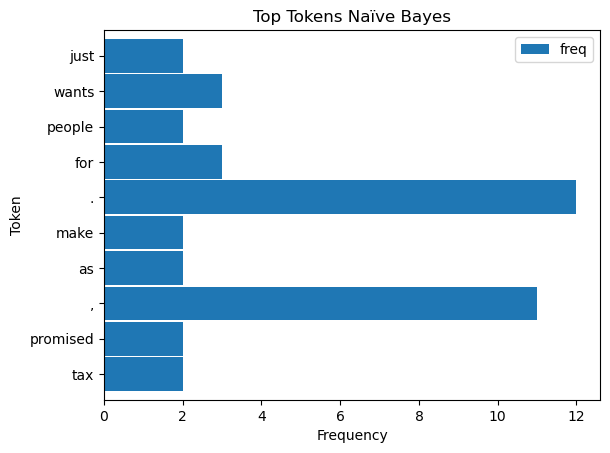

In [131]:
# creates graph
ax_nb = freq_er_nb.head(10).plot(kind='barh', width=0.95)
ax_nb.invert_yaxis()
ax_nb.set(xlabel='Frequency', ylabel='Token', title='Top Tokens Naïve Bayes')

In [132]:
counter_nb = Counter()

In [133]:
er_nb['text'].loc[er_nb["predicted"] == er_nb["actual"]].map(counter_nb.update);

In [134]:
print(counter_nb.most_common(20))

[(',', 40), ('.', 39), ('!', 18), ('trump', 9), ('for', 8), ('wants', 8), ('...', 6), ('clinton', 5), ('hillary', 5), ('will', 5), ('big', 5), ('said', 5), ('donald', 5), ('just', 4), ('?', 4), ('do', 4), ('bush', 4), ('would', 4), ('with', 4), ('&', 4)]


In [135]:
freq_er_nb_2 = pd.DataFrame.from_dict(counter_nb, orient='index', columns=['freq'])
freq_er_nb_2 = freq_er_nb_2.query('freq >= 2')
freq_er_nb_2.index.name = 'token'

[Text(0.5, 0, 'Frequency'),
 Text(0, 0.5, 'Token'),
 Text(0.5, 1.0, 'Top Tokens Naïve Bayes: Correct Predictions')]

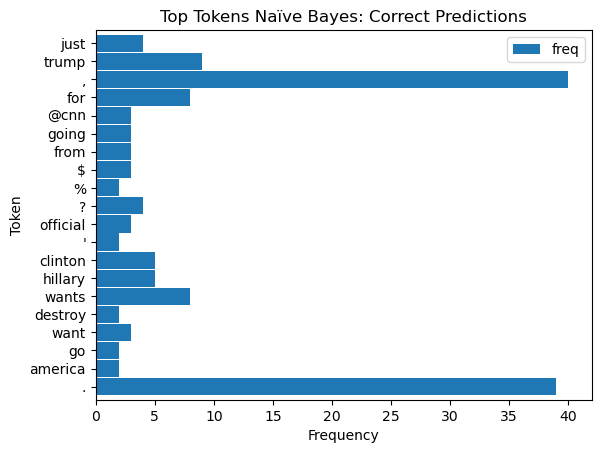

In [136]:
ax_nb_2 = freq_er_nb_2.head(20).plot(kind='barh', width=0.95)
ax_nb_2.invert_yaxis()
ax_nb_2.set(xlabel='Frequency', ylabel='Token', title='Top Tokens Naïve Bayes: Correct Predictions')

In [137]:
# creates counters for tokens
counter_mis = Counter()
counter_not_mis = Counter()

In [138]:
# fills counters with tokens and their frequencies
df['text'].loc[df['isMisrepresentation'] == 't'].map(counter_mis.update);
df['text'].loc[df['isMisrepresentation'] == 'f'].map(counter_not_mis.update);

In [139]:
counter_mis

Counter({'hillary': 24,
         'said': 17,
         'with': 15,
         'respect': 1,
         'isis': 2,
         ',': 120,
         'finally': 1,
         'where': 2,
         'need': 3,
         '.': 148,
         'do': 8,
         'want': 10,
         '4': 1,
         'more': 9,
         'years': 3,
         'incompetent': 1,
         'leadership': 1,
         '?': 16,
         'maga': 1,
         '!': 82,
         'haim': 1,
         'saban': 1,
         'clinton': 12,
         '’': 28,
         'top': 1,
         'hollywood': 1,
         'donor': 1,
         'demands': 1,
         'racial': 1,
         'profiling': 1,
         'muslims': 1,
         'just': 12,
         'will': 17,
         'not': 11,
         'use': 8,
         'term': 3,
         'radical': 3,
         'islamic': 1,
         'but': 9,
         'incapable': 1,
         'saying': 3,
         'why': 2,
         'afraid': 2,
         'obama': 8,
         '&': 12,
         'e-mails': 1,
         '@co': 1,
       

(-0.5, 399.5, 199.5, -0.5)

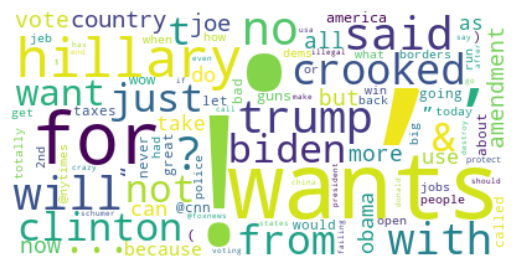

In [140]:
# creates word cloud from misrepresentation items
wc = WordCloud(max_words=100, stopwords=None, background_color = "white")
wc.generate_from_frequencies(counter_mis)
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")

(-0.5, 399.5, 199.5, -0.5)

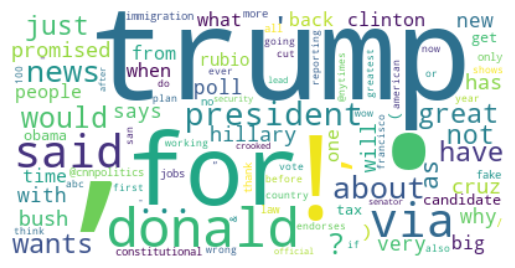

In [141]:
# creates word cloud from not-misrepresentation items
wc = WordCloud(max_words=100, stopwords=None, background_color = "white")
wc.generate_from_frequencies(counter_not_mis)
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")